This notebook plots various diagnostics of the number of joint storm surge & precipitation extremes, including in comparison to the number of wind speed & precipitation extremes.

In [1]:
import numpy as np
import xarray as xr
import os
import fnmatch
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
%config InlineBackend.figure_format = 'retina'
from open_CMIP6_num_joint_extremes import open_CMIP6_num_joint_extremes, open_CMIP6_num_joint_extremes_wp

In [2]:
def subplot_n_sp_eu(da,gridspec_idx,subplot_title,cmap,v,plot_cbar,cbar_label=None):
    ax = plt.subplot(gs[gridspec_idx[0],gridspec_idx[-1]],projection=ccrs.Robinson(central_longitude=0))

    ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
    ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')
    sc=ax.scatter(da.lon,da.lat,c=da,cmap=cmap,vmin=v[0],vmax=v[-1],transform=ccrs.PlateCarree(),zorder=3)
    
    sc.set_edgecolor('face')
    ax.coastlines(zorder=1)
    ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
    if plot_cbar:
        cax=ax.inset_axes(bounds=(0, -.1,1,.075))
        cb=fig.colorbar(sc, cax=cax,orientation='horizontal',label=cbar_label)
    ax.set_title(subplot_title)
    return ax,sc

Load output of joint probability analysis:

In [3]:
#load surges & pr:
in_fn_sp = '/home/jovyan/CMIP6cex/output/num_extremes/HighResMIP/timeseries_eu_gesla2_tgs/surge_pr/40yr_p98_lag0d_declus1d_ref2000/GFDL-CM4C192/GFDL-CM4C192.gr3.day.r1i1p1f1.num_extremes.highresSST-pres_fut.nc'
in_fn_wp = '/home/jovyan/CMIP6cex/output/num_extremes/HighResMIP/timeseries_eu_gesla2_tgs/sfcWind_pr/40yr_p98_lag0d_declus1d_ref2000/GFDL-CM4C192/GFDL-CM4C192.gr3.day.r1i1p1f1.num_extremes.highresSST-pres_fut.nc'
num_joint_sp = xr.open_dataset(in_fn_sp)
num_joint_wp = xr.open_dataset(in_fn_wp)

In [4]:
num_extremes_mlr_eval = xr.open_dataset('gesla2_mlr_n_sp_evaluation.nc').sel(threshold=.98) #open statistical storm surge validation file

Plot ensemble mean (d)N SP (and difference with dN WP):

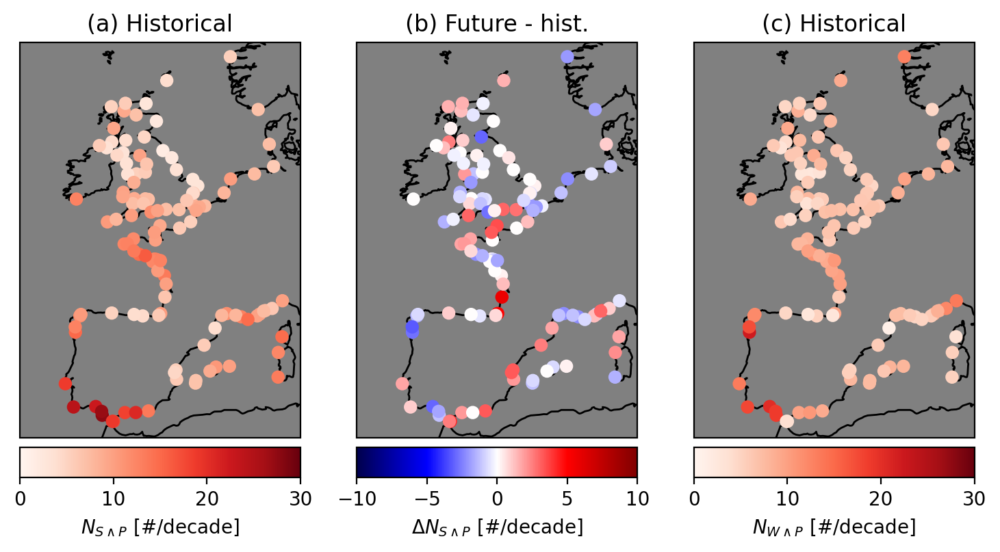

In [6]:
fig=plt.figure(figsize=(9,9.5)) #generate figure  
gs = fig.add_gridspec(2,3)
gs.update(hspace=.2)


n_sp_ds = num_joint_sp.num_joint_extremes.sum(dim='month',skipna=False)
n_wp_ds = num_joint_wp.num_joint_extremes.sum(dim='month',skipna=False)

n_sp_ds_present = n_sp_ds.sel(window=2000)
n_sp_ds_future = n_sp_ds.sel(window=2030)
n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present

n_wp_ds_present = n_wp_ds.sel(window=2000)
n_wp_ds_future = n_wp_ds.sel(window=2030)
n_wp_ds_diff = n_wp_ds_future - n_sp_ds_present

#plot historical

ax,sc = subplot_n_sp_eu(.25*n_sp_ds_present.mean(dim='member_id'),[0,0],
                    '(a) Historical','Reds',[0,30],plot_cbar=True,cbar_label='$N_{S\wedge P}$ [#/decade]')

#plot changes
ax,sc = subplot_n_sp_eu(.25*n_sp_ds_diff.mean(dim='member_id'),[0,1],
                    '(b) Future - hist.','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P}$ [#/decade]')


ax,sc = subplot_n_sp_eu(.25*n_wp_ds_present.mean(dim='member_id'),[0,2],
                    '(c) Historical','Reds',[0,30],plot_cbar=True,cbar_label='$N_{W\wedge P}$ [#/decade]')



Plot ensemble standard deviation:

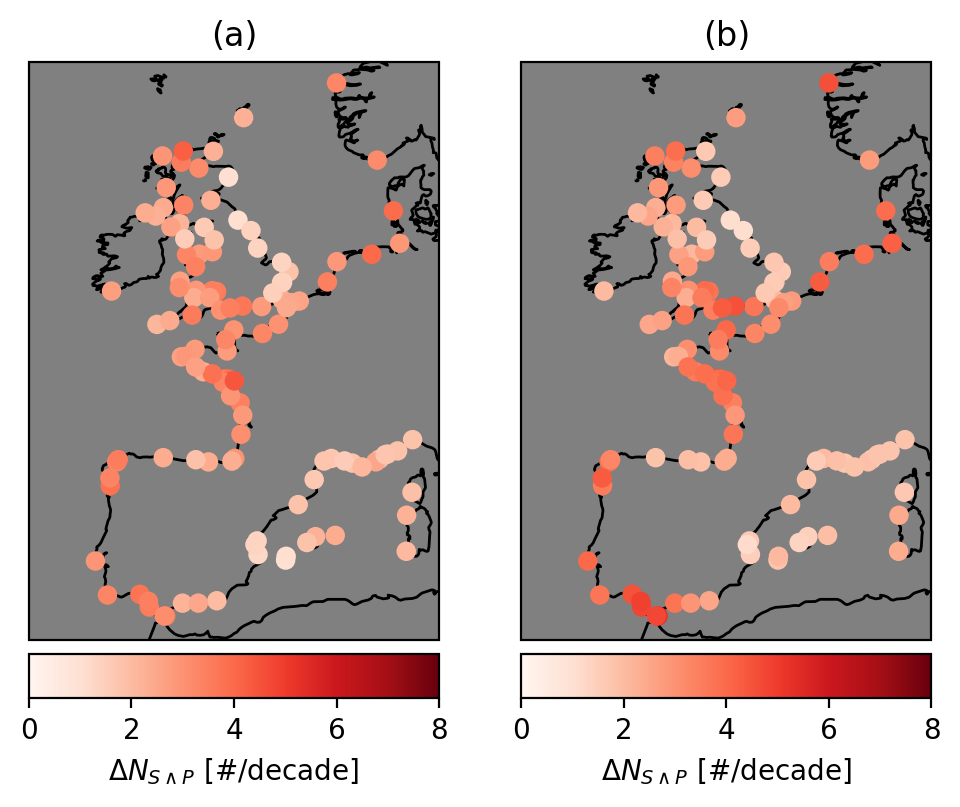

In [16]:
fig=plt.figure(figsize=(9,9.5)) #generate figure  
gs = fig.add_gridspec(2,3)
gs.update(hspace=.2)

for s,ssp in enumerate(ssps):
    n_sp_ds = num_joint_sp_isect.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    n_sp_ds_diff = n_sp_ds.sel(window=2080) - n_sp_ds.sel(window=2000)
    
    #SSP
    ax,sc = subplot_n_sp_eu(.25*n_sp_ds_diff.mean(dim='member_id').std(dim='source_id'),[0,s],
                            ['(a)','(b)'][s],'Reds',[0,8],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P}$ [#/decade]')

#fig.savefig('Figures/ensspread_dN_SP.pdf',format='pdf',dpi=300,bbox_inches='tight')

Compute how much larger standard deviation becomes if using single members

In [18]:
for s,ssp in enumerate(ssps):
    n_sp_ds = num_joint_sp_isect.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    n_sp_ds_diff = n_sp_ds.sel(window=2080) - n_sp_ds.sel(window=2000)
    
    finite_mems = np.isfinite(n_sp_ds_diff.isel(tg=0))

    members= np.zeros((len(n_sp_ds_diff.source_id)))
    for i in np.arange(len(n_sp_ds_diff.source_id)):
        try:
            members[i] = np.where(finite_mems[i,:])[0][0]
        except:
            members[i] = 0
    ix = xr.DataArray(members,dims=['source_id'],coords={'source_id':n_sp_ds_diff.source_id})

    onemem_ens = n_sp_ds_diff.isel(member_id=ix.astype('int')).dropna(dim='source_id')
    
    print(100*((onemem_ens.std(dim='source_id')-n_sp_ds_diff.mean(dim='member_id').std(dim='source_id'))/n_sp_ds_diff.mean(dim='member_id').std(dim='source_id')).mean())

<xarray.DataArray 'num_joint_extremes' ()>
array(17.51814498)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp245'
<xarray.DataArray 'num_joint_extremes' ()>
array(14.70119521)
Coordinates:
    height    float64 10.0
    quantile  float64 0.98
    ssp       <U6 'ssp585'


Compute error metrics of ensemble mean historical N_sp and N_sp based on GESLA2 surges and ERA5 precipitation:

In [19]:
nRMSE = np.sqrt(((num_extremes_mlr_eval.num_cooc_g3-.25*n_sp_ds_present.mean(dim='member_id').mean(dim='source_id'))**2).mean(dim='tg'))/num_extremes_mlr_eval.num_cooc_g3.mean(dim='tg')
print('nRMSE = '+str(nRMSE.values))

nRMSE = 0.40421674089667975


In [20]:
r = xr.corr(num_extremes_mlr_eval.num_cooc_g3,.25*n_sp_ds_present.mean(dim='member_id').mean(dim='source_id'),dim='tg')
print('r = '+str(r.values))

r = 0.7526504609631515


Plot decomposition of dN_SP:

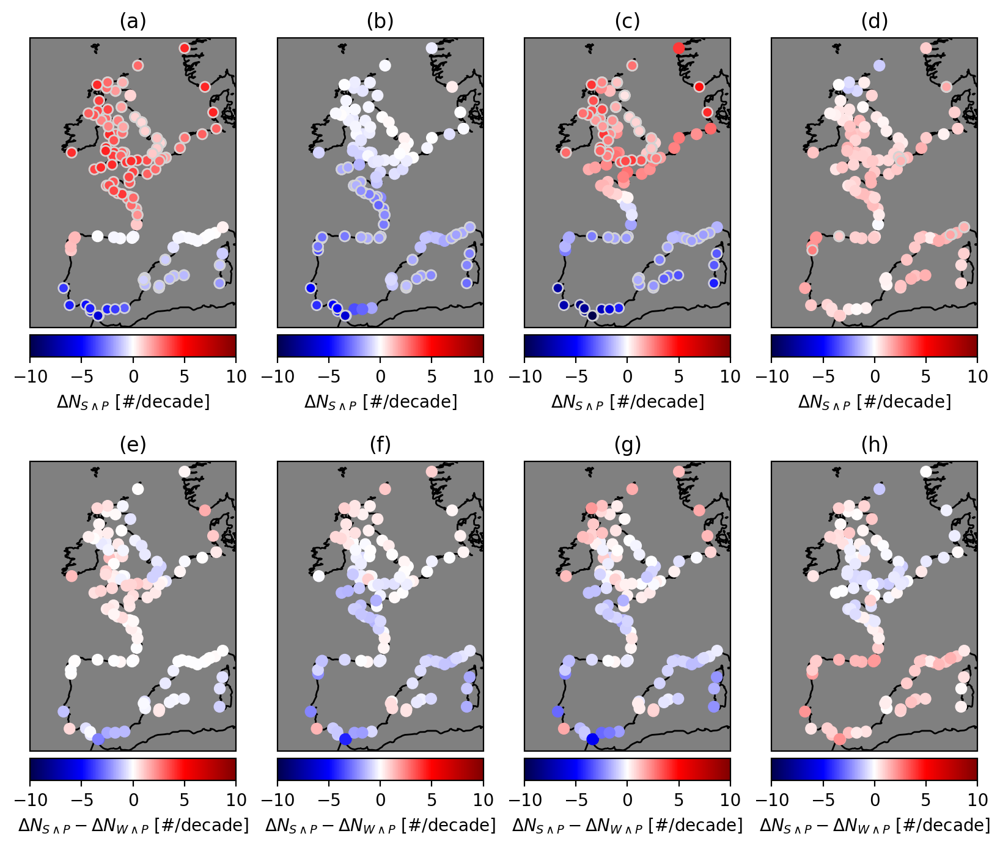

In [28]:
fig=plt.figure(figsize=(10,8.25)) #generate figure  
gs = fig.add_gridspec(2,4)
gs.update(hspace=.2)

for s,ssp in enumerate(['ssp585']):
    n_wp_ds = num_joint_wp_isect.sel(ssp=ssp).sum(dim='month',skipna=False)
    n_sp_ds = num_joint_sp_isect.sel(ssp=ssp).sum(dim='month',skipna=False)
    
    n_wp_ds_present = n_wp_ds.sel(window=2000)#.sel(window=2005)
    n_wp_ds_future = n_wp_ds.sel(window=2080)#.sel(window=2085)
    n_wp_ds_diff = n_wp_ds_future - n_wp_ds_present

    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
    n_sp_ds_future = n_sp_ds.sel(window=2080)#.sel(window=2085)
    n_sp_ds_diff = n_sp_ds_future - n_sp_ds_present

    #(a) plot pr-driven
    ax,sc = subplot_n_sp_eu(.25*n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id'),[0,0],
                        '(a)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P}$ [#/decade]')
    
    #overlay with grey-edged circles for significant changes
    mean_lt_std = np.abs(n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').std(dim='source_id'))
    sc=ax.scatter(n_sp_ds.lon[mean_lt_std],n_sp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_pr_driven.mean(dim='member_id').mean(dim='source_id'))[mean_lt_std],cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)
    
    #(b) plot surge-driven
    ax,sc = subplot_n_sp_eu(.25*n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').mean(dim='source_id'),[0,1],
                        '(b)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P}$ [#/decade]')
    
    #overlay with grey-edged circles for significant changes
    mean_lt_std = np.abs(n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').std(dim='source_id'))
    sc=ax.scatter(n_sp_ds.lon[mean_lt_std],n_sp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_driven.mean(dim='member_id').mean(dim='source_id'))[mean_lt_std],cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)
    
    #(c) plot surge-pr driven
    ax,sc = subplot_n_sp_eu(.25*n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').mean(dim='source_id'),[0,2],
                        '(c)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P}$ [#/decade]')
    
    #overlay with grey-edged circles for significant changes
    mean_lt_std = np.abs(n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').std(dim='source_id'))
    sc=ax.scatter(n_sp_ds.lon[mean_lt_std],n_sp_ds.lat[mean_lt_std],c=(.25*n_sp_ds_diff.num_joint_extremes_surge_pr_driven.mean(dim='member_id').mean(dim='source_id'))[mean_lt_std],cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)
    
    #(d) plot dependence driven
    dependence_driven = (n_sp_ds_diff.num_joint_extremes-n_sp_ds_diff.num_joint_extremes_surge_pr_driven)
    
    ax,sc = subplot_n_sp_eu(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id'),[0,3],
                        '(d)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P}$ [#/decade]')
    
    #overlay with grey-edged circles for significant changes
    mean_lt_std = np.abs(dependence_driven.mean(dim='member_id').mean(dim='source_id'))>np.abs(dependence_driven.mean(dim='member_id').std(dim='source_id'))
    sc=ax.scatter(n_sp_ds.lon[mean_lt_std],n_sp_ds.lat[mean_lt_std],c=(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id'))[mean_lt_std],cmap='seismic',edgecolor='lightgrey',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=4)
    
    
    ##### plot differences of these with decomposition of dN wp at tide gauges
    ax,sc = subplot_n_sp_eu(.25*(n_sp_ds_diff.num_joint_extremes_pr_driven-n_wp_ds_diff.num_joint_extremes_pr_driven).mean(dim='member_id').mean(dim='source_id'),[1,0],
                        '(e)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax,sc = subplot_n_sp_eu(.25*(n_sp_ds_diff.num_joint_extremes_surge_driven-n_wp_ds_diff.num_joint_extremes_sfcWind_driven).mean(dim='member_id').mean(dim='source_id'),[1,1],
                        '(f)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    ax,sc = subplot_n_sp_eu(.25*(n_sp_ds_diff.num_joint_extremes_surge_pr_driven-n_wp_ds_diff.num_joint_extremes_sfcWind_pr_driven).mean(dim='member_id').mean(dim='source_id'),[1,2],
                        '(g)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')
    
    dependence_driven_sp = (n_sp_ds_diff.num_joint_extremes-n_sp_ds_diff.num_joint_extremes_surge_pr_driven)
    dependence_driven_wp = (n_wp_ds_diff.num_joint_extremes-n_wp_ds_diff.num_joint_extremes_sfcWind_pr_driven)
    ax,sc = subplot_n_sp_eu(.25*(dependence_driven_sp-dependence_driven_wp).mean(dim='member_id').mean(dim='source_id'),[1,3],
                        '(h)','seismic',[-10,10],plot_cbar=True,cbar_label='$\Delta N_{S\wedge P} - \Delta N_{W\wedge P}$ [#/decade]')

#fig.savefig('Figures/ensmean_dN_SP_decomp_v2.jpg',format='jpg',dpi=300,bbox_inches='tight')


Plot differences between ensemble mean N sp and observational:

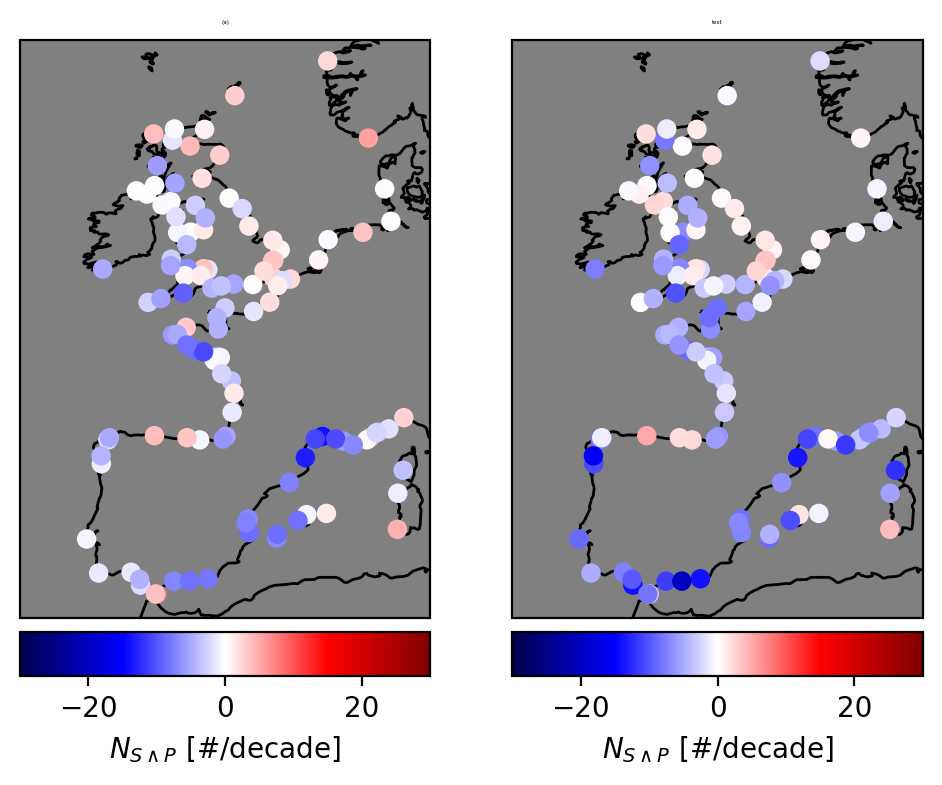

In [40]:
fig=plt.figure(figsize=(9,9.5)) #generate figure  
gs = fig.add_gridspec(2,3)
gs.update(hspace=.2)

for s,ssp in enumerate(['ssp585']):
    n_sp_ds = num_joint_sp_isect.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)
    n_sp_ds_present = n_sp_ds.sel(window=2000)#.sel(window=2005)
  
    ax,sc = subplot_n_sp_eu((.25*n_sp_ds_present.mean(dim='member_id').mean(dim='source_id'))-num_extremes_mlr_eval.num_cooc_g3,[0,0],
                    '(a)','seismic',[-30,30],plot_cbar=True,cbar_label='$N_{S\wedge P}$ [#/decade]')
    
    ax,sc = subplot_n_sp_eu((.25*n_sp_ds_present.mean(dim='member_id').mean(dim='source_id'))-num_extremes_mlr_eval.num_cooc_mlr_g3,[0,1],
                    '(b)','seismic',[-30,30],plot_cbar=True,cbar_label='$N_{S\wedge P}$ [#/decade]')
#fig.savefig('Figures/ensmean_dN_SP_biases.pdf',format='pdf',dpi=300,bbox_inches='tight')

Plot dN sp per model:

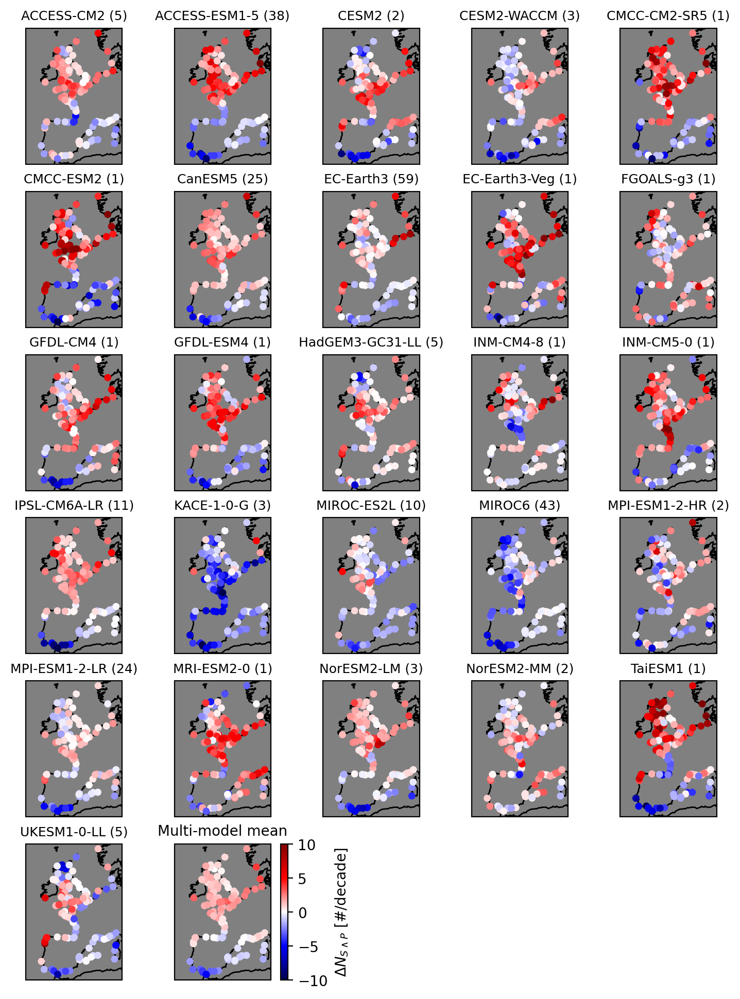

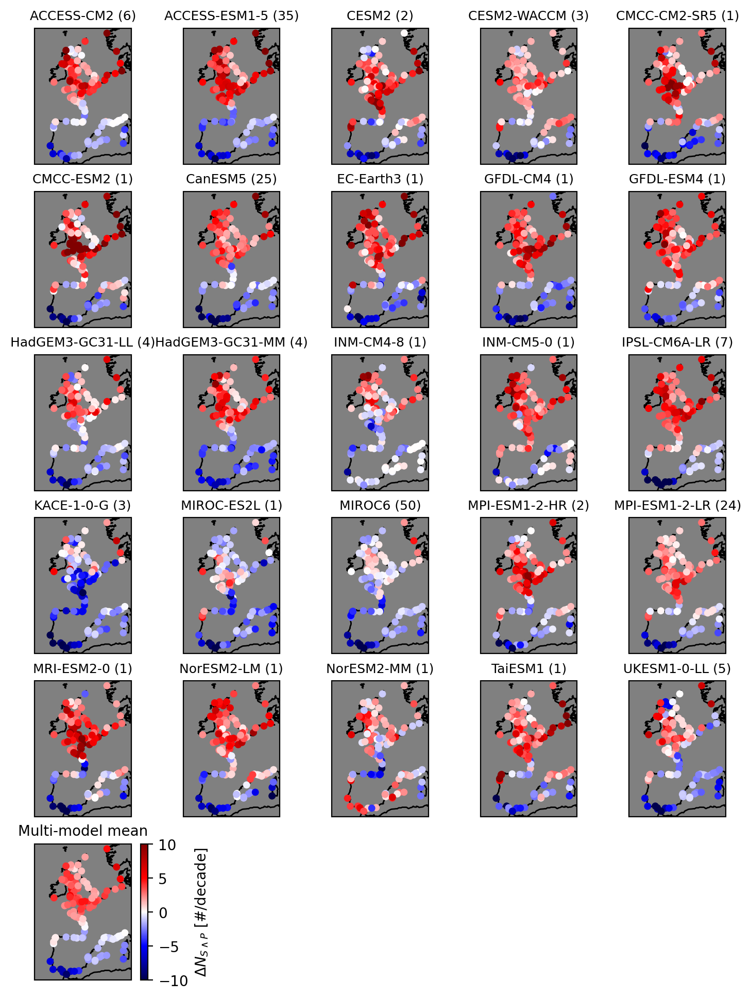

In [45]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_sp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(9,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    for m,model in enumerate(ssp_ds.source_id.values):
        n_members = np.isfinite(ssp_ds_present.sel(source_id=model)).sum(dim='member_id')[0].values
        if n_members==0:
            continue
            
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.sel(source_id=model).mean(dim='member_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        
        ax.set_title(model +' ('+str(n_members)+')',fontsize=9)
        i+=1
        if m==len(ssp_ds.source_id.values)-1: #plot ensemble mean
            ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

            ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
            ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

            #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
            sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.mean(dim='member_id').mean(dim='source_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
            ax.coastlines(zorder=1)    
            ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
            ax.set_title('Multi-model mean',fontsize=10)
            
            
            cax=ax.inset_axes(bounds=(1.1, 0,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{S\wedge P}$ [#/decade]')
    fig.savefig('Figures/dn_SP_per_model_'+ssp+'.jpg',format='jpg',dpi=300,bbox_inches='tight')

Plot dN wp per model:

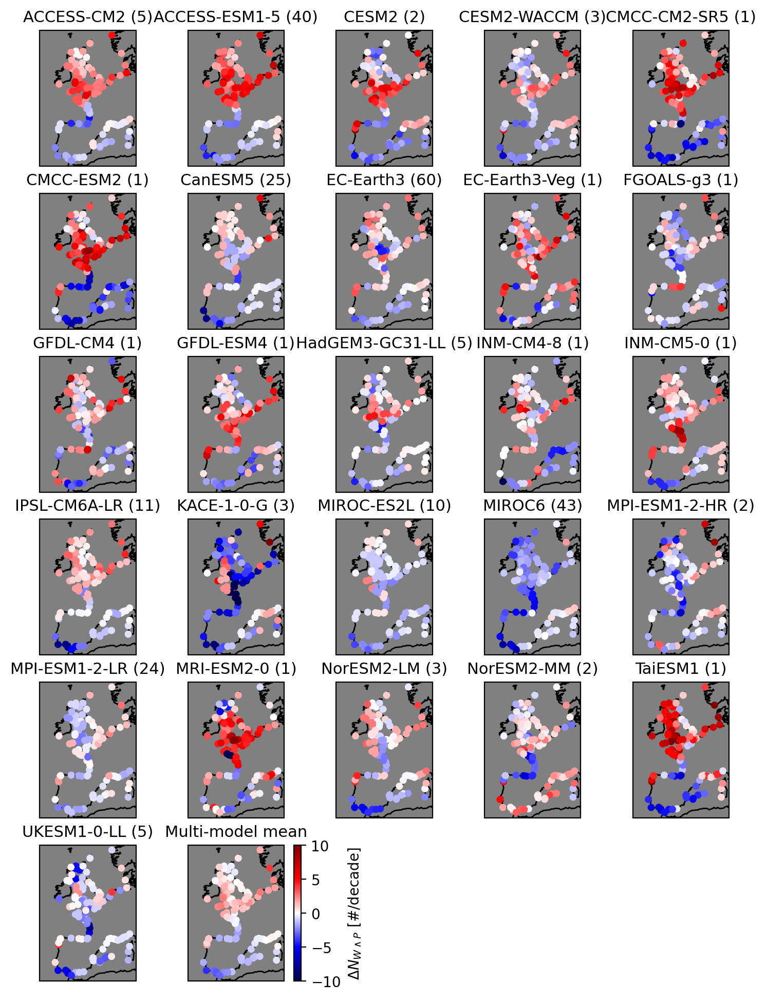

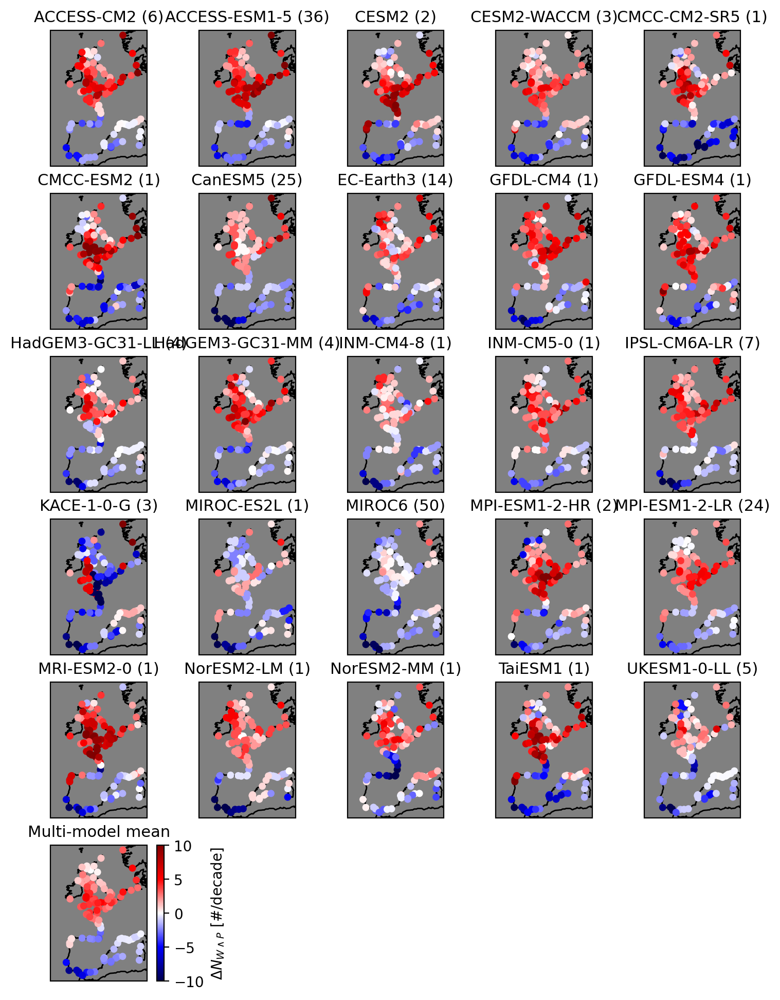

In [29]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_wp.sel(ssp=ssp).num_joint_extremes.sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(9,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    for m,model in enumerate(ssp_ds.source_id.values):
        n_members = np.isfinite(ssp_ds_present.sel(source_id=model)).sum(dim='member_id')[0].values
        if n_members==0:
            continue
            
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.sel(source_id=model).mean(dim='member_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        
        ax.set_title(model +' ('+str(n_members)+')',fontsize=11)
        i+=1
        if m==len(ssp_ds.source_id.values)-1: #plot ensemble mean
            ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

            ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
            ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

            #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
            sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.mean(dim='member_id').mean(dim='source_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
            ax.coastlines(zorder=1)    
            ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
            ax.set_title('Multi-model mean',fontsize=11)
            
            
            cax=ax.inset_axes(bounds=(1.1, 0,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{W\wedge P}$ [#/decade]')

Plot pr-driven dN sp per model:

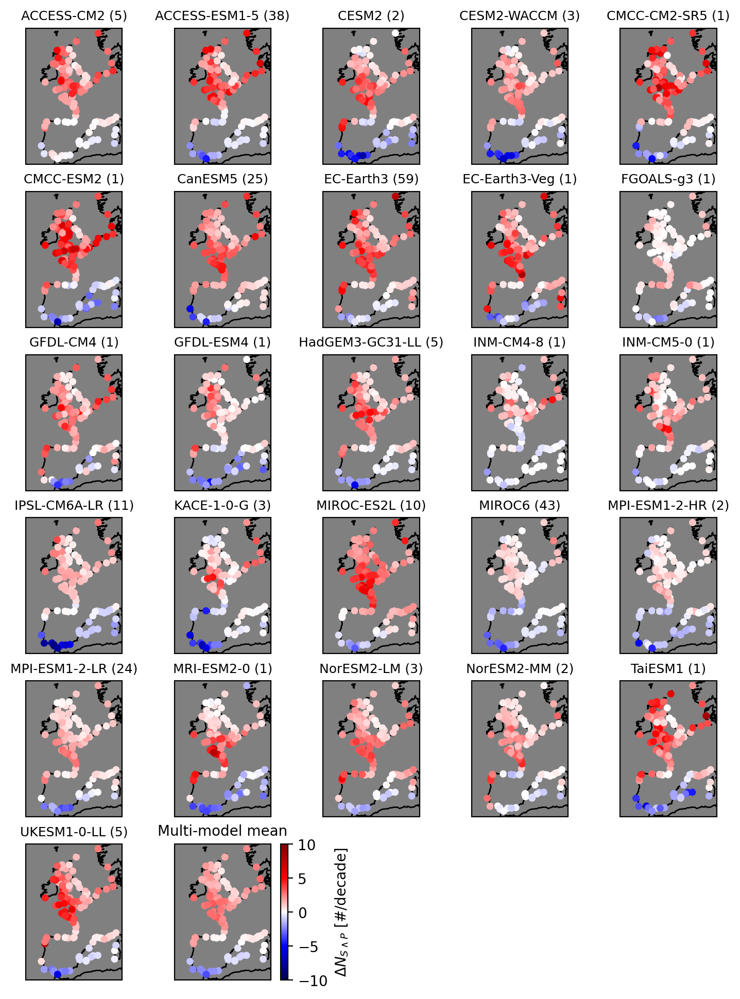

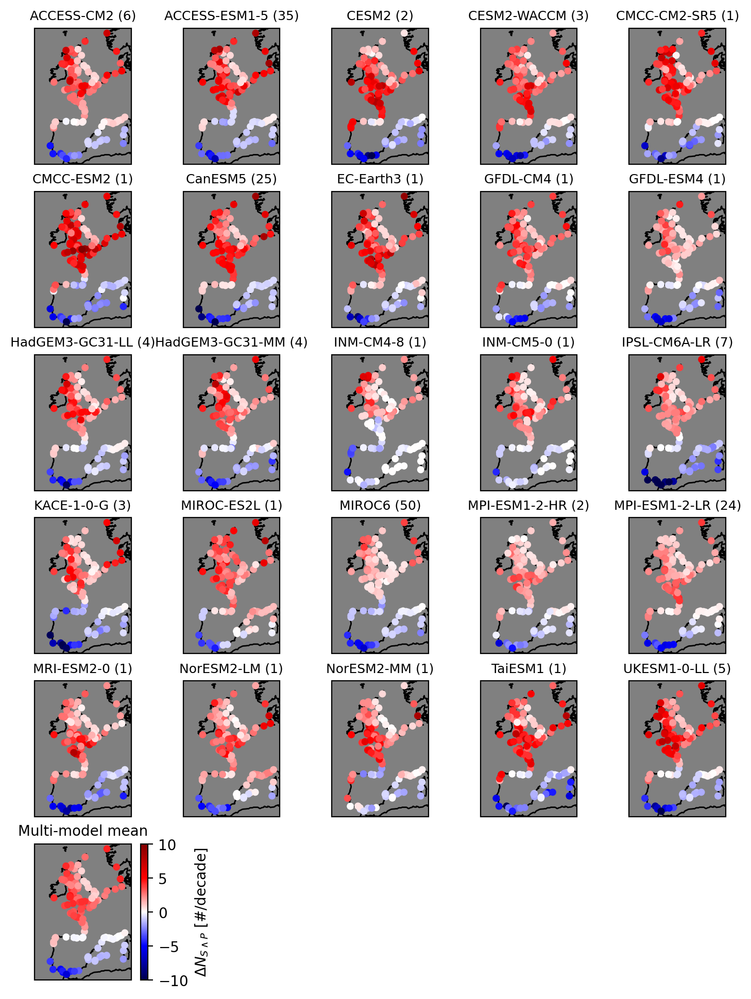

In [24]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_sp.sel(ssp=ssp).num_joint_extremes_pr_driven.sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(9,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    for m,model in enumerate(ssp_ds.source_id.values):
        n_members = np.isfinite(ssp_ds_present.sel(source_id=model)).sum(dim='member_id')[0].values
        if n_members==0:
            continue
            
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.sel(source_id=model).mean(dim='member_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        
        ax.set_title(model +' ('+str(n_members)+')',fontsize=9)
        i+=1
        if m==len(ssp_ds.source_id.values)-1: #plot ensemble mean
            ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

            ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
            ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

            #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
            sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.mean(dim='member_id').mean(dim='source_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
            ax.coastlines(zorder=1)    
            ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
            ax.set_title('Multi-model mean',fontsize=10)
            
            
            cax=ax.inset_axes(bounds=(1.1, 0,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{S\wedge P}$ [#/decade]')
    #fig.savefig('Figures/dn_SP_per_model_'+ssp+'.jpg',format='jpg',dpi=300,bbox_inches='tight')

Plot surge-driven dN sp per model:

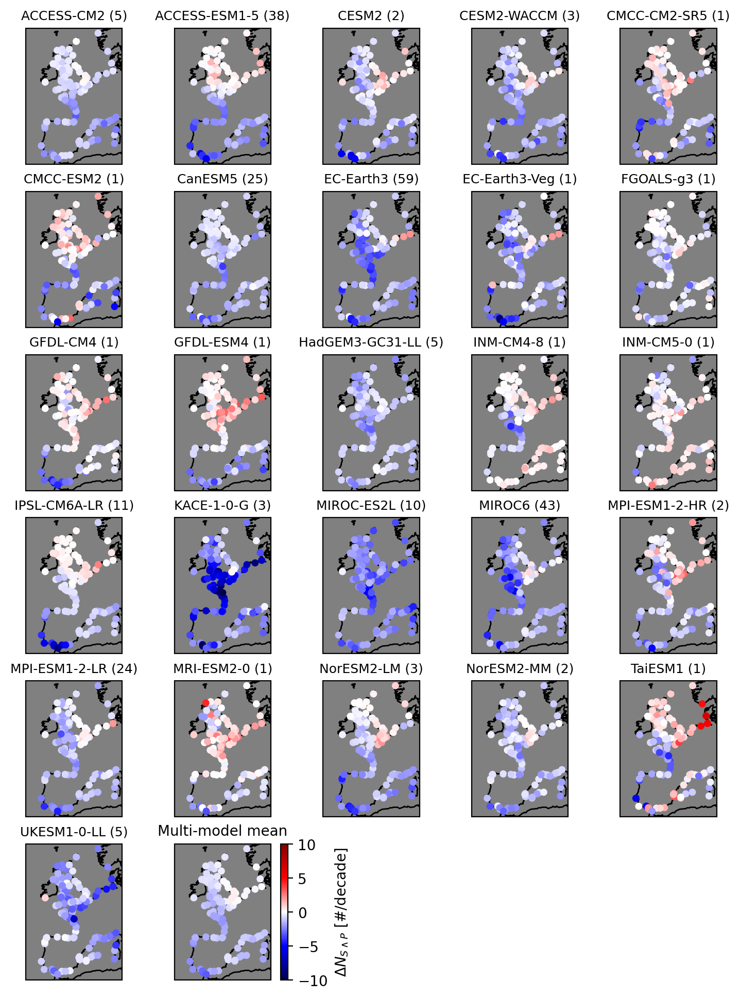

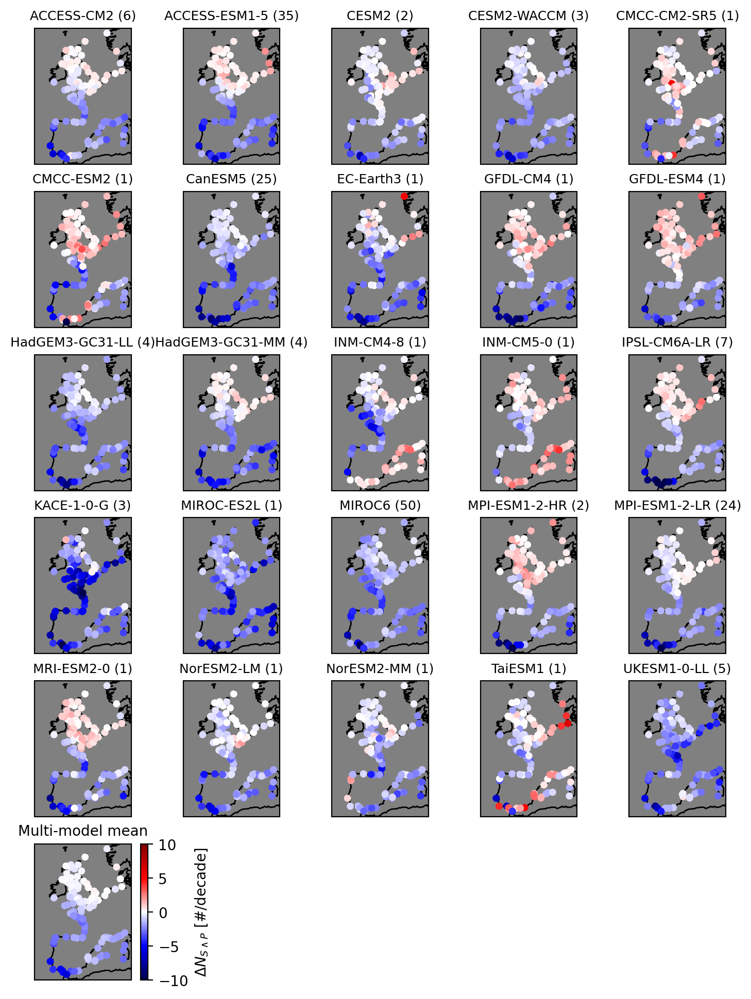

In [25]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_sp.sel(ssp=ssp).num_joint_extremes_surge_driven.sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present

    fig=plt.figure(figsize=(9,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    for m,model in enumerate(ssp_ds.source_id.values):
        n_members = np.isfinite(ssp_ds_present.sel(source_id=model)).sum(dim='member_id')[0].values
        if n_members==0:
            continue
            
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.sel(source_id=model).mean(dim='member_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        
        ax.set_title(model +' ('+str(n_members)+')',fontsize=9)
        i+=1
        if m==len(ssp_ds.source_id.values)-1: #plot ensemble mean
            ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

            ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
            ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

            #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
            sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*ssp_ds_diff.mean(dim='member_id').mean(dim='source_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
            ax.coastlines(zorder=1)    
            ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
            ax.set_title('Multi-model mean',fontsize=10)
            
            
            cax=ax.inset_axes(bounds=(1.1, 0,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{S\wedge P}$ [#/decade]')
   

Plot dependence-driven dN sp per model:

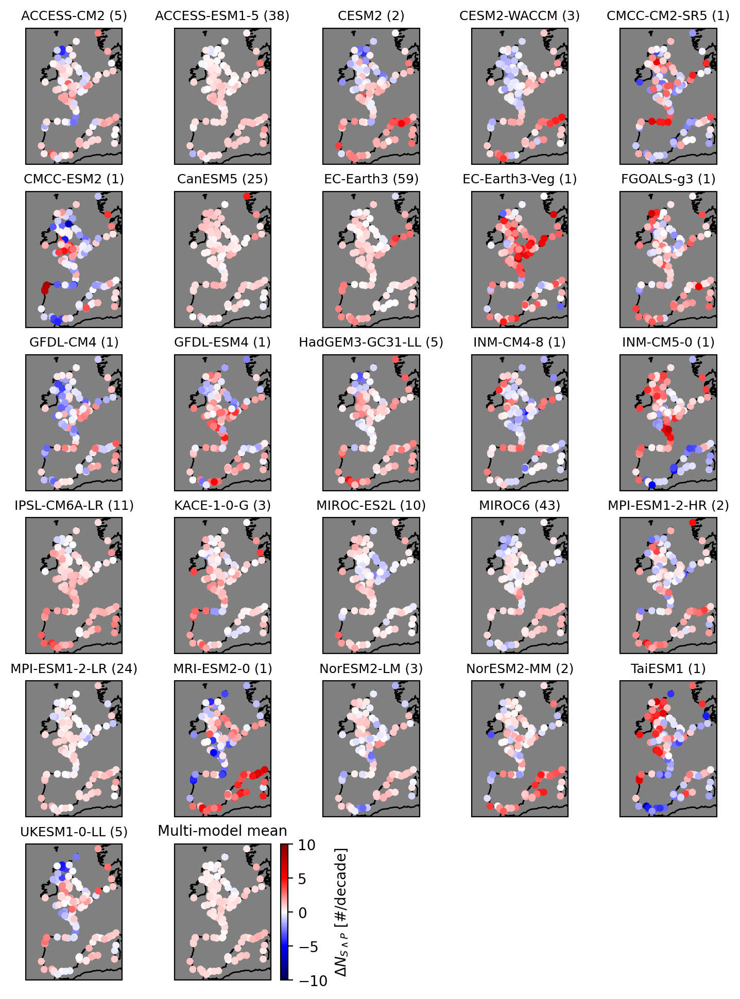

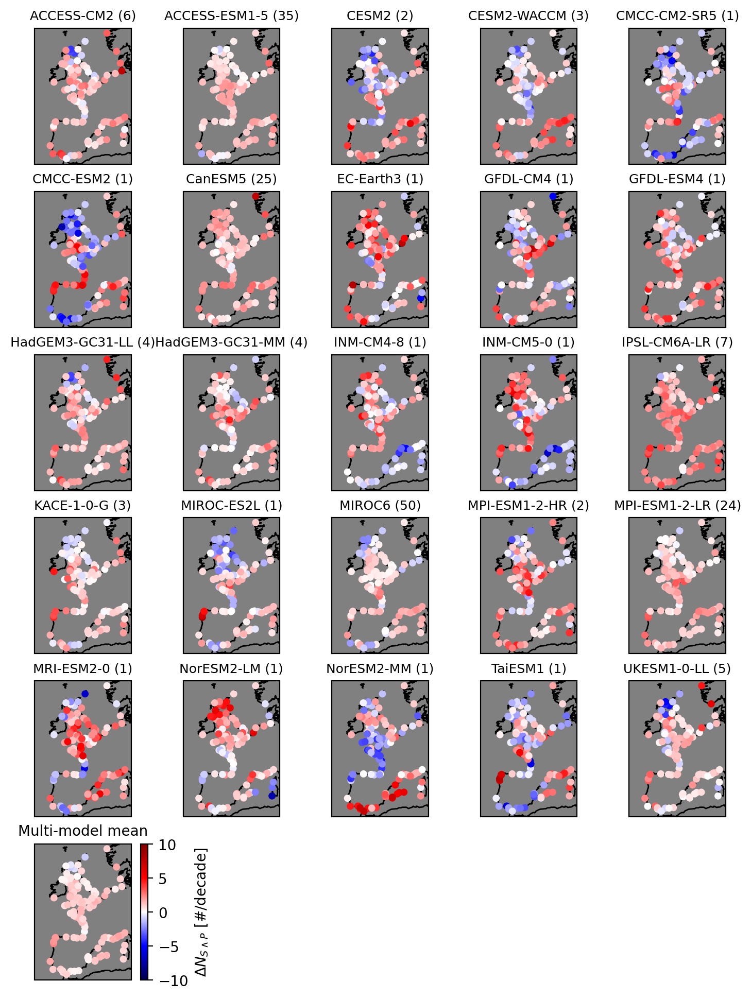

In [28]:
for ssp in ['ssp245','ssp585']:
    ssp_ds = num_joint_sp.sel(ssp=ssp).sum(dim='month',skipna=False)

    ssp_ds_present = ssp_ds.sel(window=2000)
    ssp_ds_future = ssp_ds.sel(window=2080)
    ssp_ds_diff = ssp_ds_future - ssp_ds_present
    
    dependence_driven = (ssp_ds_diff.num_joint_extremes-ssp_ds_diff.num_joint_extremes_surge_pr_driven)
    
    fig=plt.figure(figsize=(9,12)) #generate figure  
    gs = fig.add_gridspec(6,5)
    i=0
    for m,model in enumerate(ssp_ds.source_id.values):
        n_members = np.isfinite(dependence_driven.sel(source_id=model)).sum(dim='member_id')[0].values
        if n_members==0:
            continue
            
        #1991-2020
        ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

        ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
        ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

        #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
        sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*dependence_driven.sel(source_id=model).mean(dim='member_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
        ax.coastlines(zorder=1)    
        ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
        
        ax.set_title(model +' ('+str(n_members)+')',fontsize=9)
        i+=1
        if m==len(ssp_ds.source_id.values)-1: #plot ensemble mean
            ax = plt.subplot(gs[np.unravel_index(i,(6,5))],projection=ccrs.Robinson(central_longitude=0))

            ax.add_feature(cartopy.feature.OCEAN, zorder=0,facecolor='grey')
            ax.add_feature(cartopy.feature.LAND, zorder=0, facecolor='grey')

            #sc=(.25*ssp_ds_diff.num_joint_extremes.sel(source_id=model).mean(dim='member_id')).plot(cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3,ax=ax,add_colorbar=False)
            sc=ax.scatter(ssp_ds.lon,ssp_ds.lat,c=(.25*dependence_driven.mean(dim='member_id').mean(dim='source_id')),s=16,cmap='seismic',vmin=-10,vmax=10,transform=ccrs.PlateCarree(),zorder=3)
            ax.coastlines(zorder=1)    
            ax.set_extent([-13, 10, 35, 63], crs=ccrs.PlateCarree())
            ax.set_title('Multi-model mean',fontsize=10)
            
            
            cax=ax.inset_axes(bounds=(1.1, 0,.075,1))
            cb=fig.colorbar(sc, cax=cax,orientation='vertical',label='$\Delta N_{S\wedge P}$ [#/decade]')
   